In [2]:
import warnings

warnings.filterwarnings("ignore")
import random
import time

import cryptocompare
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from tqdm.autonotebook import tqdm
from tslearn.clustering import TimeSeriesKMeans

### Cписок из всех торгующихся криптовалют

In [3]:
len(cryptocompare.get_coin_list(format=True))

8462

In [4]:
coin_list = cryptocompare.get_coin_list(format=True)

In [7]:
coin_list_short = random.sample(coin_list, 500)

#### Выберем валюту BTC2 для отслеживания внутри кластеров

In [8]:
if "BTC2" not in coin_list_short:
    coin_list_short.append("BTC2")

### Cкачаем цены закрытия для имеющихся криптовалют по трем разным временным промежуткам

#### За последние 30 дней с дневной частотой

In [9]:
ticker_data_day = []
coin_list = []

for ticker in tqdm(coin_list_short):
    try:
        ticker_obj = cryptocompare.get_historical_price_day(
            ticker, currency="USD", limit=30
        )
        close_price = list(pd.DataFrame(ticker_obj).close)
        ticker_data_day.append(close_price)
        coin_list.append(ticker)
    except AttributeError:
        continue

ticker_df_day = pd.DataFrame(ticker_data_day)

  0%|          | 0/501 [00:00<?, ?it/s]

[ERROR] CCCAGG market does not exist for this coin pair (GRIDCOIN-USD)
[ERROR] CCCAGG market does not exist for this coin pair (LOCG-USD)
[ERROR] CCCAGG market does not exist for this coin pair (TER-USD)
[ERROR] CCCAGG market does not exist for this coin pair (KRUGERCOIN-USD)
[ERROR] CCCAGG market does not exist for this coin pair (PANGEA-USD)
[ERROR] CCCAGG market does not exist for this coin pair (PROB-USD)
[ERROR] CCCAGG market does not exist for this coin pair (SAP-USD)
[ERROR] CCCAGG market does not exist for this coin pair (CAMC-USD)
[ERROR] CCCAGG market does not exist for this coin pair (ZED-USD)
[ERROR] CCCAGG market does not exist for this coin pair (GSTS-USD)
[ERROR] CCCAGG market does not exist for this coin pair (VLTC-USD)
[ERROR] CCCAGG market does not exist for this coin pair (MM-USD)
[ERROR] CCCAGG market does not exist for this coin pair (LAX-USD)
[ERROR] CCCAGG market does not exist for this coin pair (DEVX-USD)
[ERROR] CCCAGG market does not exist for this coin pair 

In [10]:
ticker_df_day.shape

(154, 31)

In [11]:
scaler = StandardScaler()
tickers_scaled_day = scaler.fit_transform(ticker_df_day.T).T

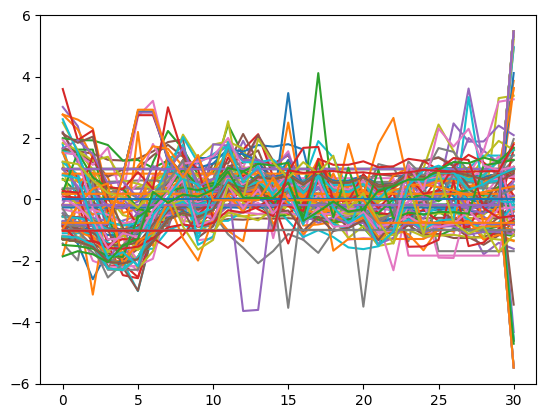

In [13]:
plt.plot(tickers_scaled_day.T);

In [14]:
def choosing_k(tickers_scaled):
    distortions = []
    K = range(1, 10)
    for k in tqdm(K):
        kmeanModel = TimeSeriesKMeans(
            n_clusters=k, metric="euclidean", n_jobs=6, max_iter=10
        )
        kmeanModel.fit(tickers_scaled)
        distortions.append(kmeanModel.inertia_)
    plt.figure(figsize=(12, 6))
    plt.plot(K, distortions, "bx-")
    plt.xlabel("k")
    plt.ylabel("Distortion")
    plt.title("Elbow Method")
    plt.show()

In [15]:
def clusters(df, tickers_scaled, num_of_clusters, metric):
    ts_kmeans = TimeSeriesKMeans(
        n_clusters=num_of_clusters, metric=metric, n_jobs=6, max_iter=10
    )
    ts_kmeans.fit(tickers_scaled)
    for cluster_number in range(num_of_clusters):
        plt.plot(
            ts_kmeans.cluster_centers_[cluster_number, :, 0].T, label=cluster_number
        )
    plt.title("Cluster centroids")
    plt.legend()
    plt.show()

    df["cluster"] = ts_kmeans.predict(tickers_scaled)
    df["coin"] = coin_list

    for cluster in range(num_of_clusters):
        print(
            "================================================================================="
        )
        print(f"                          Cluster number: {cluster}")
        print(
            "================================================================================="
        )
        plot_cluster_tickers(df[df.cluster == cluster])
    return df

In [16]:
def plot_cluster_tickers(current_cluster):
    fig, ax = plt.subplots(
        int(np.ceil(current_cluster.shape[0] / 4)),
        4,
        figsize=(15, 3 * int(np.ceil(current_cluster.shape[0] / 4))),
    )
    fig.autofmt_xdate(rotation=45)
    ax = ax.reshape(-1)

    for index, (_, row) in enumerate(current_cluster.iterrows()):
        ax[index].plot(row.iloc[:-2])
        ax[index].set_title(f"{row.coin}")
        plt.xticks(rotation=45)

    plt.tight_layout()
    plt.show()

  0%|          | 0/9 [00:00<?, ?it/s]

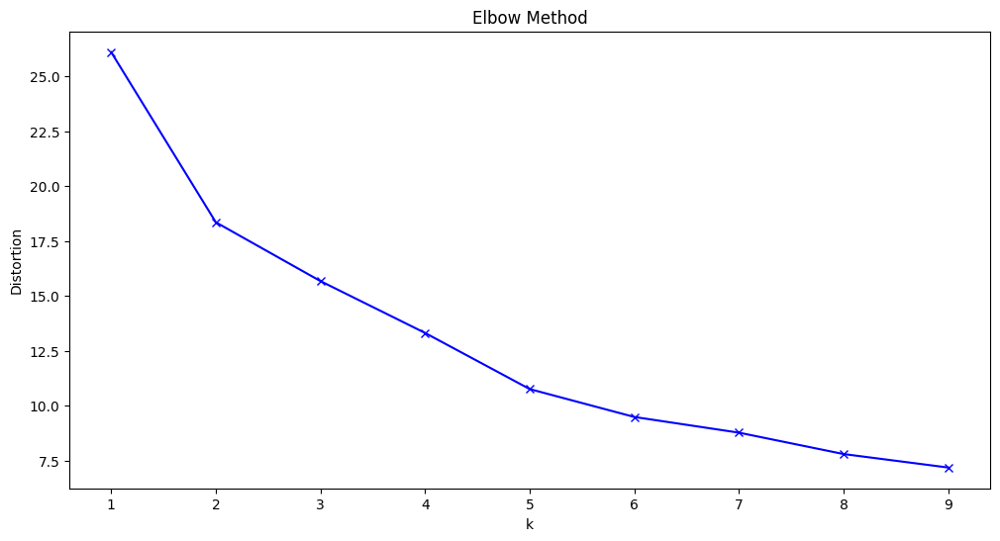

In [17]:
choosing_k(tickers_scaled_day)

In [20]:
num_of_clusters = 4  # по графику выше

### Basic KMeans

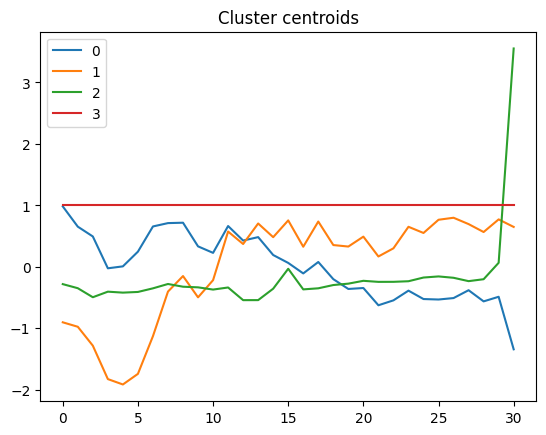

                          Cluster number: 0


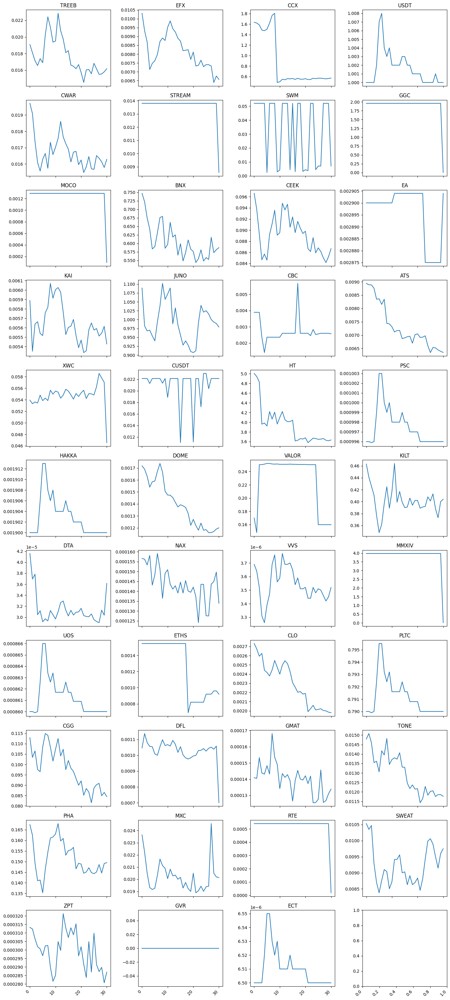

                          Cluster number: 1


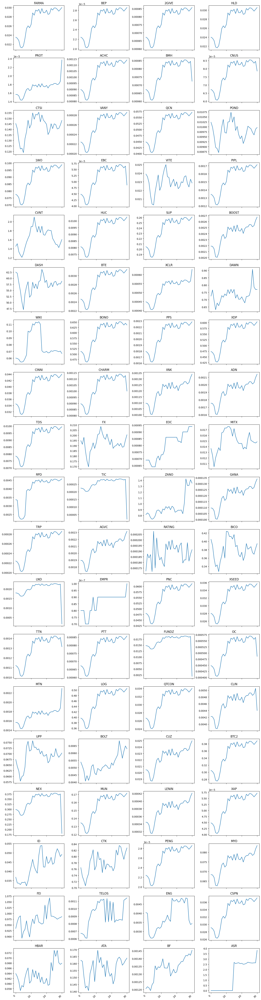

                          Cluster number: 2


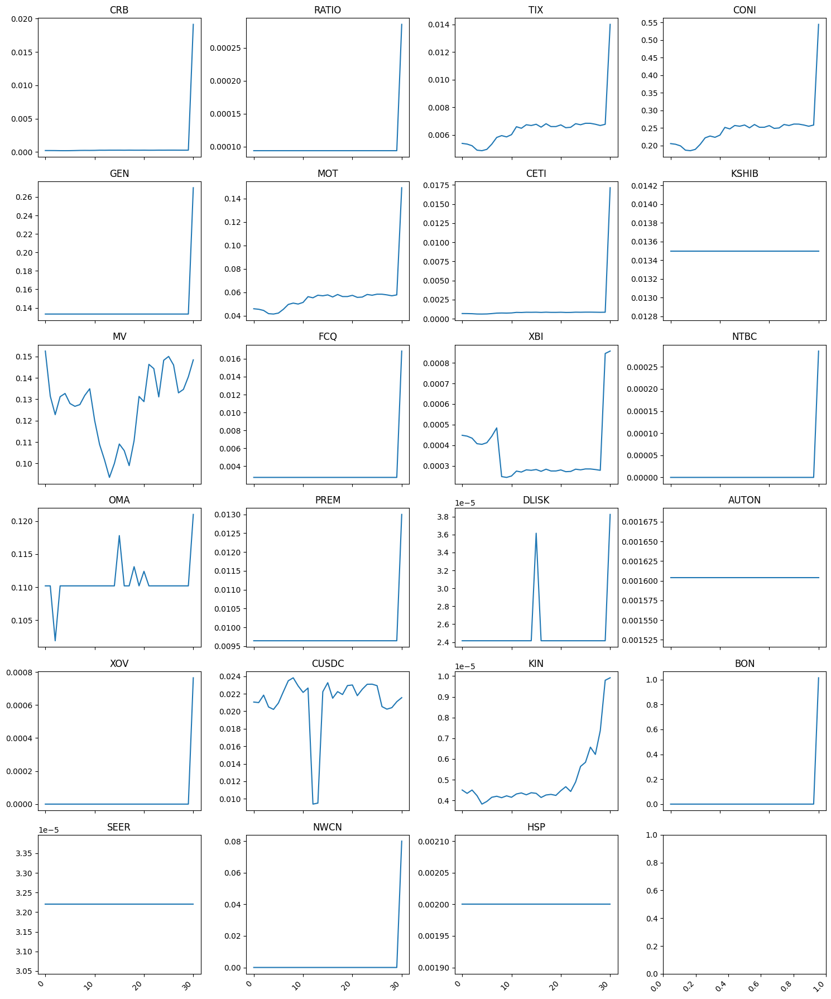

                          Cluster number: 3


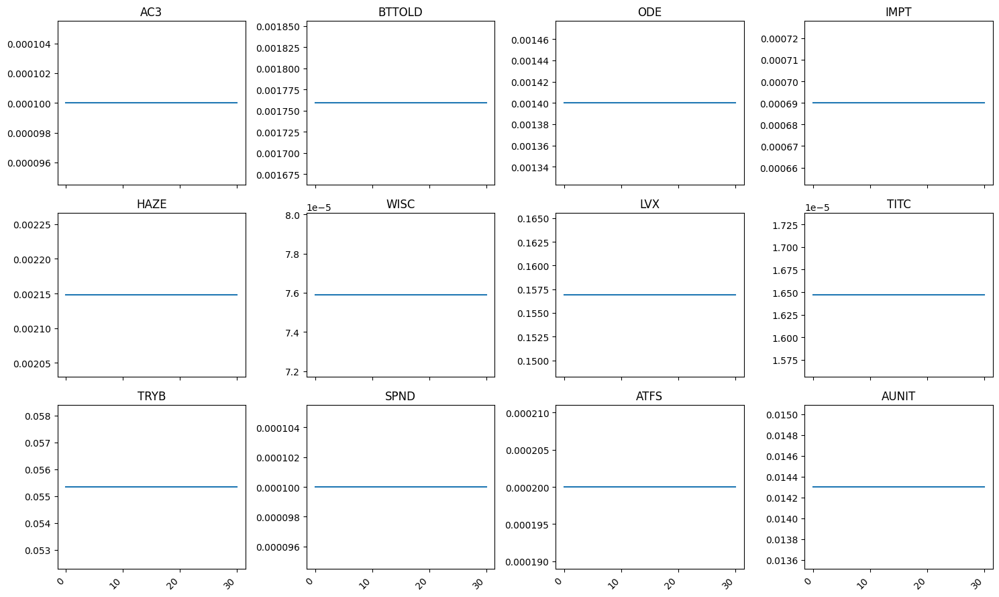

In [21]:
ticker_df_day = clusters(
    ticker_df_day, tickers_scaled_day, num_of_clusters, "euclidean"
)

In [22]:
ticker_df_day.cluster.value_counts()

1    76
0    43
2    23
3    12
Name: cluster, dtype: int64

#### Какие выводы можно сделать:
    Cluster number: 0 - в основном характеризуется резким падением и трендом на убывание
    Cluster number: 1 - в основном характеризуется поведением типа "падение и рост" (BTC2)
    Cluster number: 2 - в основном характеризуется резким скачкообразным ростом в конце периода
    Cluster number: 3 - постоянные значения

### DTW

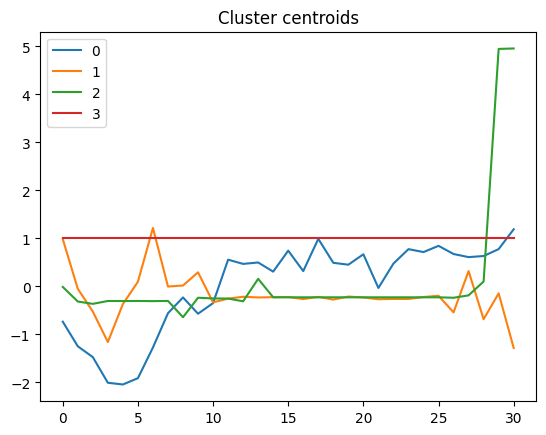

                          Cluster number: 0


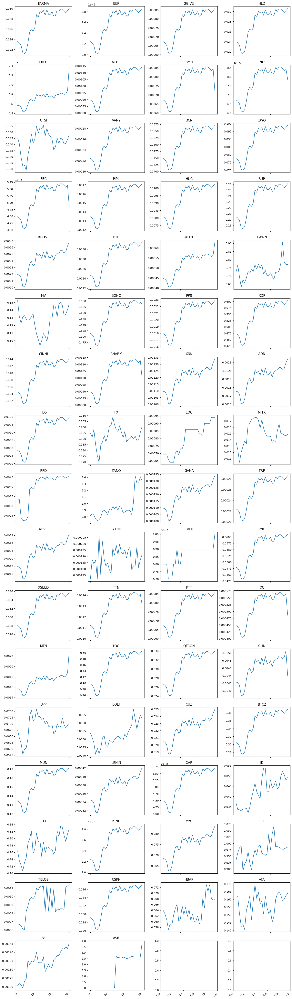

                          Cluster number: 1


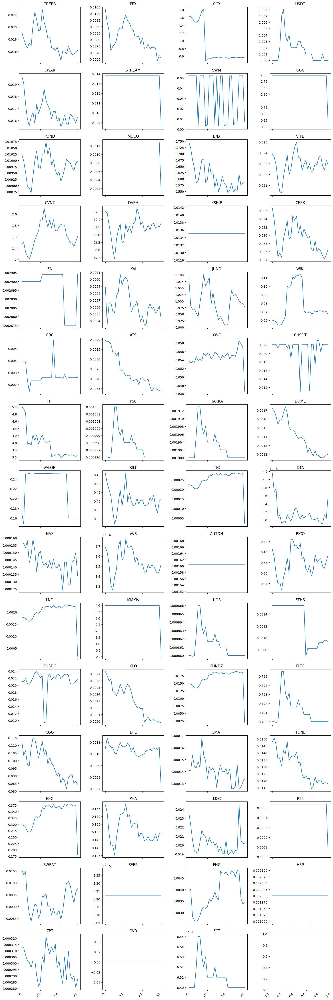

                          Cluster number: 2


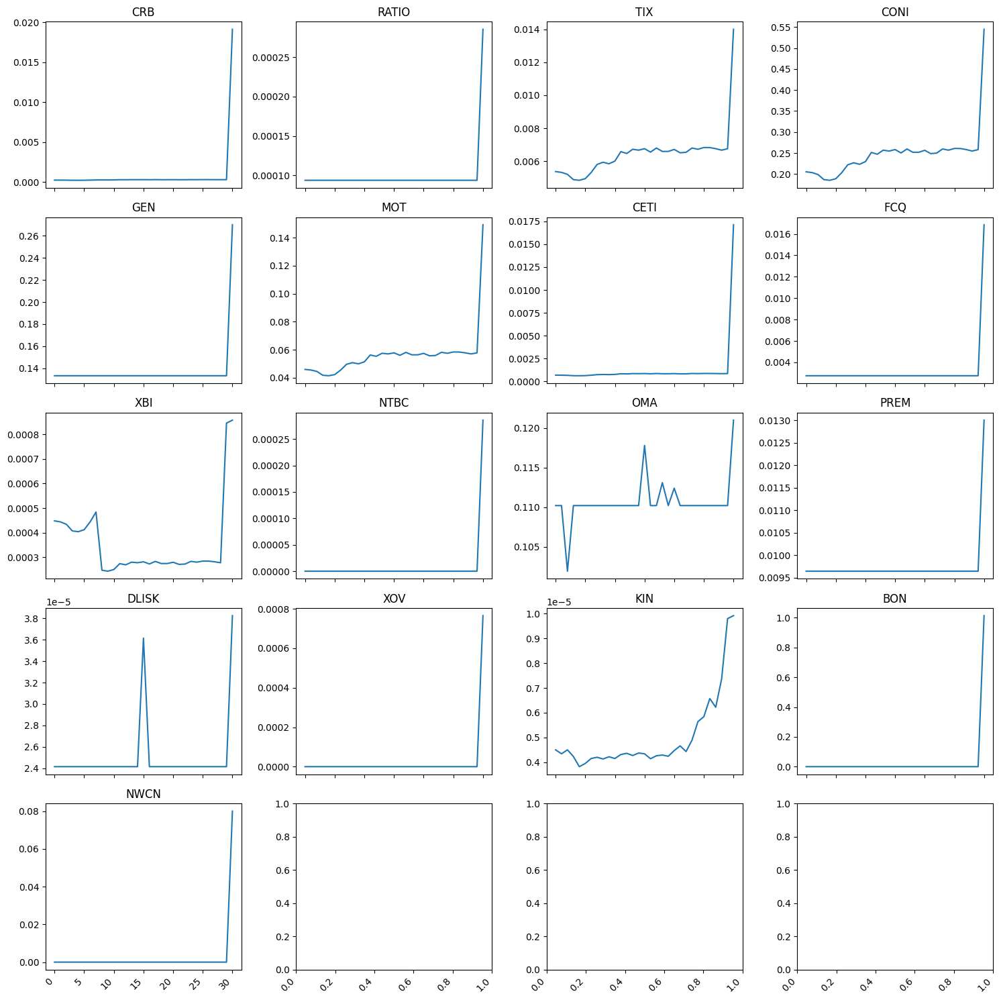

                          Cluster number: 3


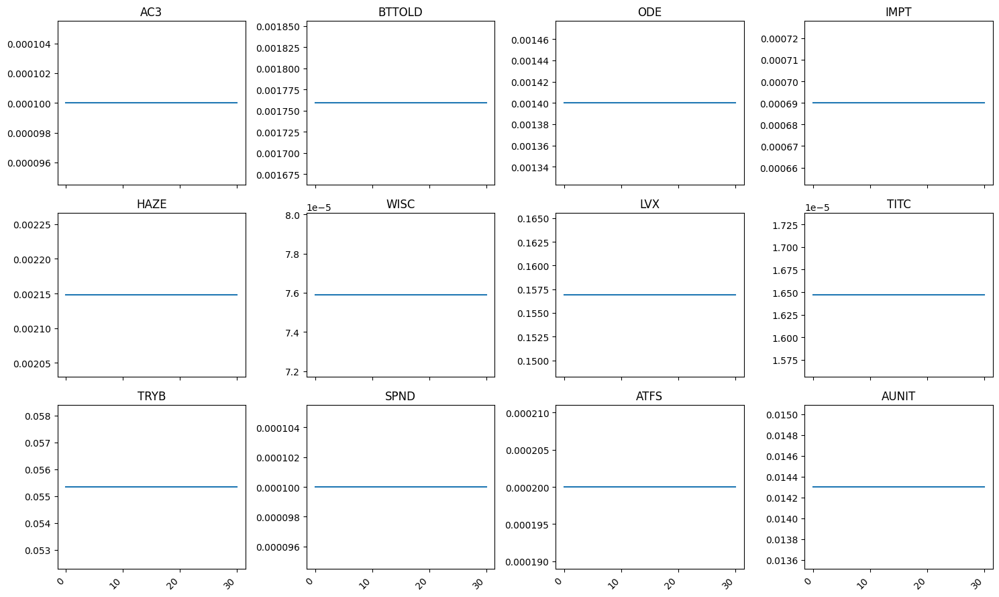

In [32]:
ticker_df_day = clusters(ticker_df_day, tickers_scaled_day, num_of_clusters, "dtw")

In [33]:
ticker_df_day.cluster.value_counts()

0    66
1    59
2    17
3    12
Name: cluster, dtype: int64

#### Какие выводы можно сделать:
    Cluster number: 0 - в основном характеризуется поведением типа "падение и рост" (BTC2)
    Cluster number: 1 - в основном характеризуется резким падением и трендом на убывание
    Cluster number: 2 - в основном характеризуется резким скачкообразным ростом в конце периода
    Cluster number: 3 - постоянные значения

#### За последние 3 дня с часовой частотой

In [34]:
ticker_data_hour = []

for ticker in tqdm(coin_list):
    try:
        ticker_obj = cryptocompare.get_historical_price_hour(
            ticker, currency="USD", limit=3 * 24
        )
        close_price = list(pd.DataFrame(ticker_obj).close)
        ticker_data_hour.append(close_price)
    except AttributeError:
        continue

ticker_df_hour = pd.DataFrame(ticker_data_hour)

  0%|          | 0/154 [00:00<?, ?it/s]

In [35]:
ticker_df_hour.shape

(154, 73)

In [36]:
scaler = StandardScaler()
tickers_scaled_hour = scaler.fit_transform(ticker_df_hour.T).T

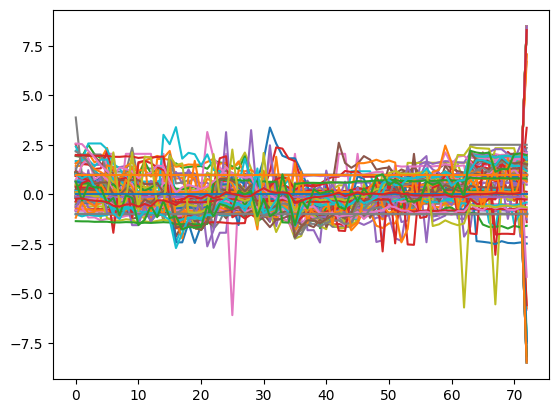

In [37]:
plt.plot(tickers_scaled_hour.T);

  0%|          | 0/9 [00:00<?, ?it/s]

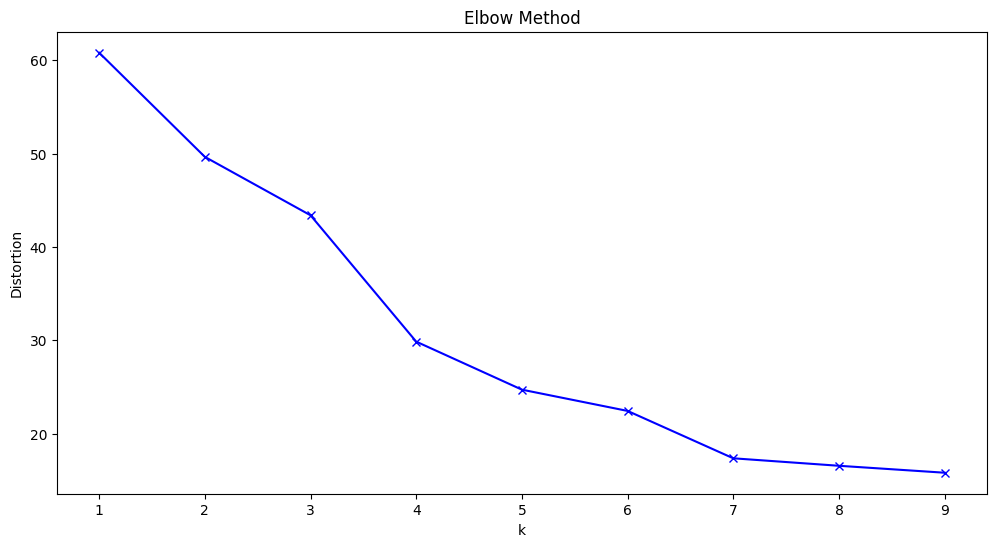

In [38]:
choosing_k(tickers_scaled_hour)

In [39]:
num_of_clusters = 4

### Basic KMeans

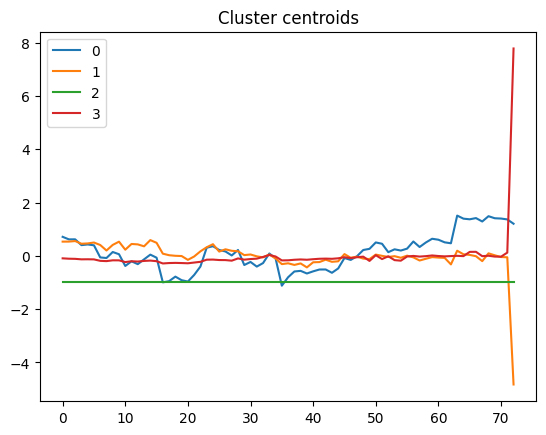

                          Cluster number: 0


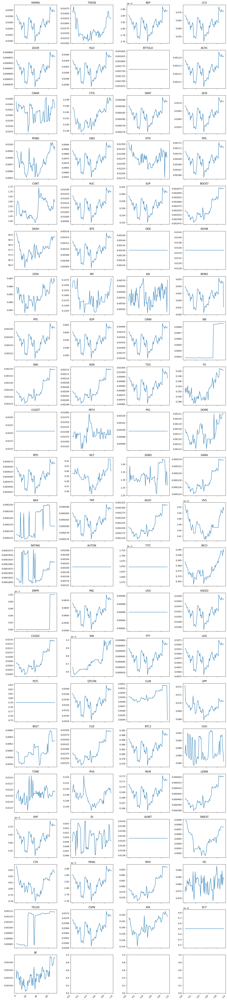

                          Cluster number: 1


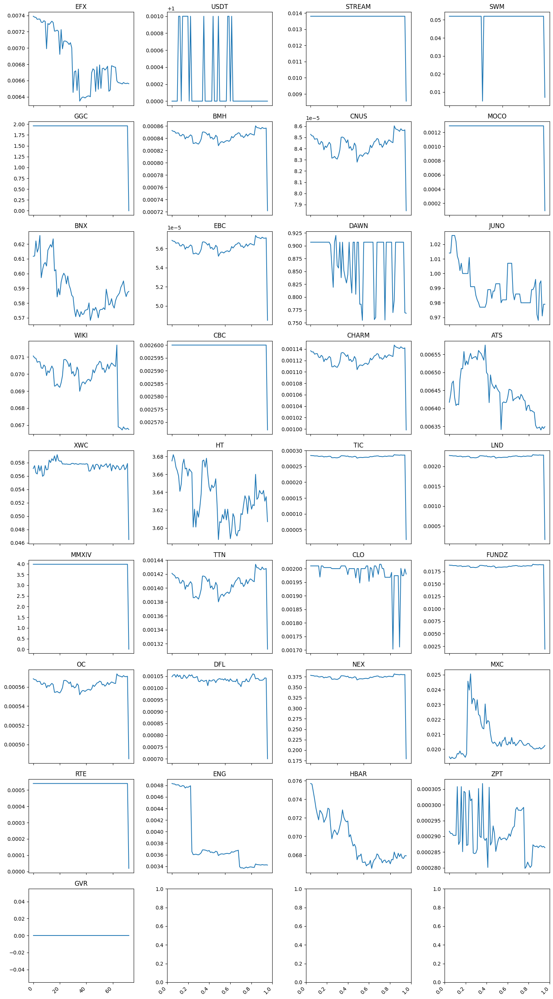

                          Cluster number: 2


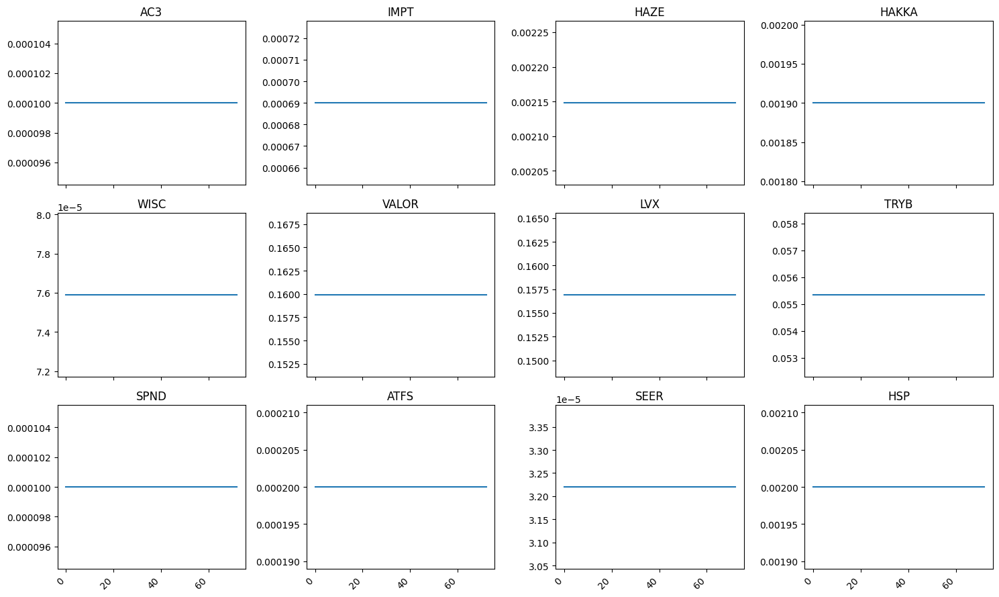

                          Cluster number: 3


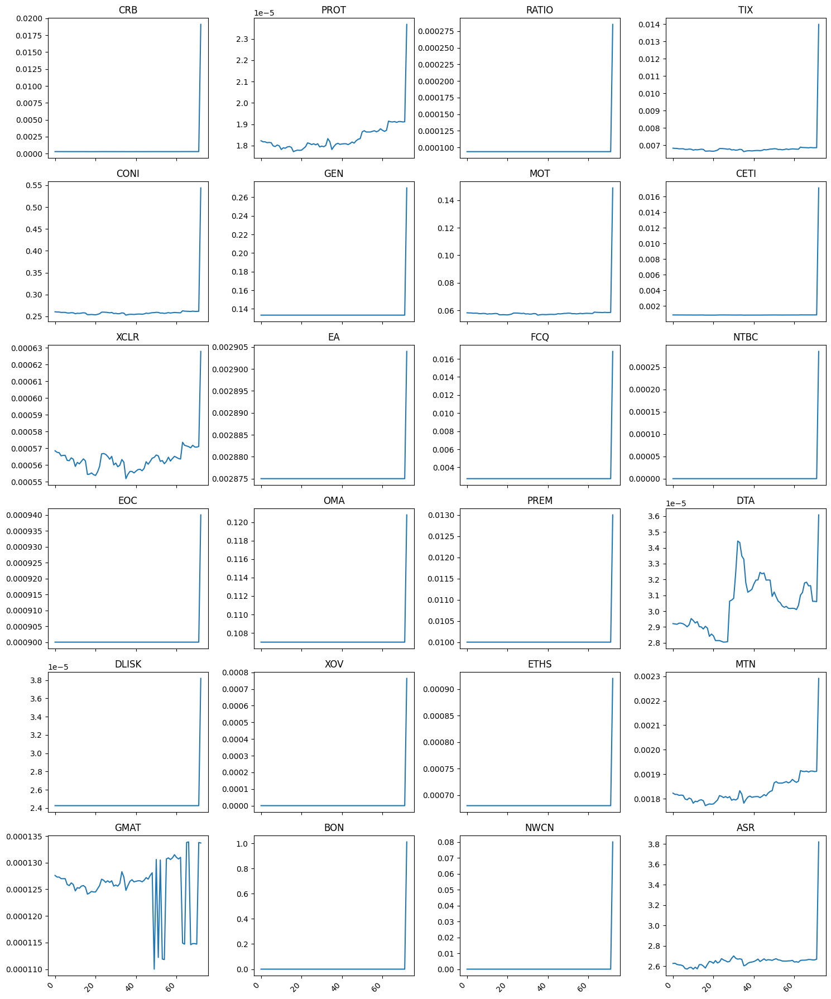

In [40]:
ticker_df_hour = clusters(
    ticker_df_hour, tickers_scaled_hour, num_of_clusters, "euclidean"
)

#### Какие выводы можно сделать:
    Cluster number: 0 - в основном характеризуется поведением типа "падение, рост, падение, рост" (BTC2)
    Cluster number: 1 - в основном характеризуется трендом на убывание
    Cluster number: 2 - постоянные значения
    Cluster number: 3 - в основном характеризуется резким скачкообразным ростом в конце периода

### DTW

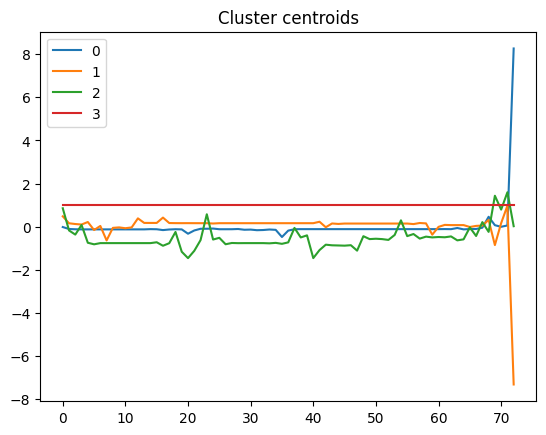

                          Cluster number: 0


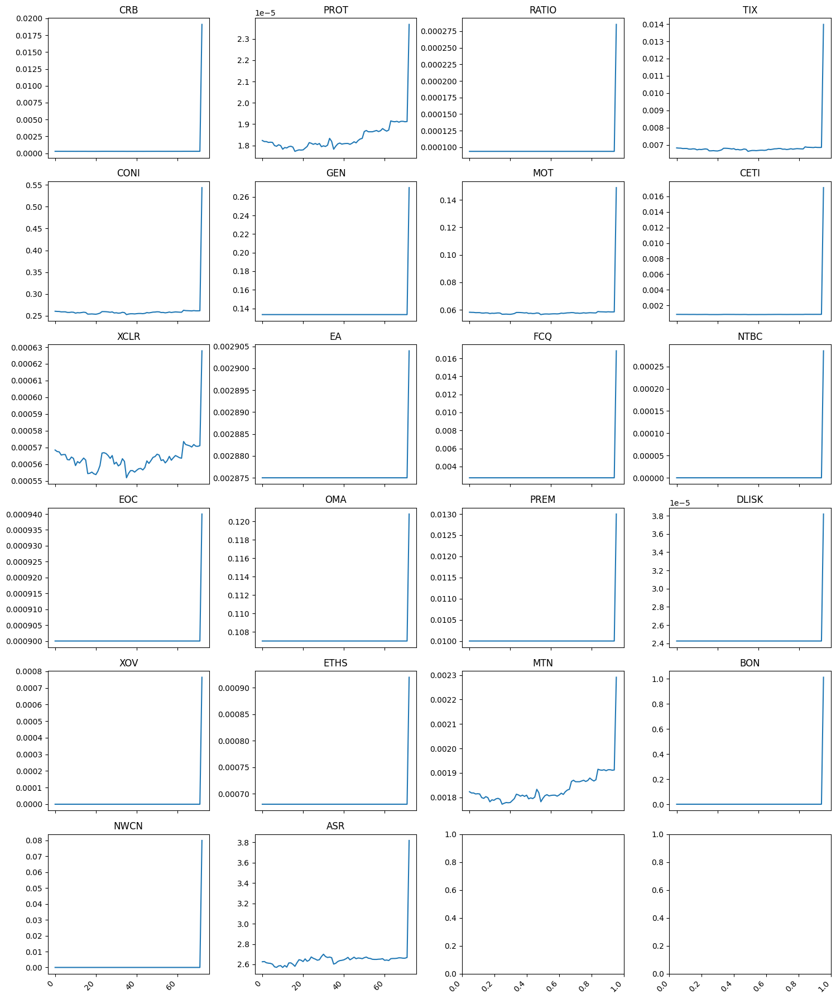

                          Cluster number: 1


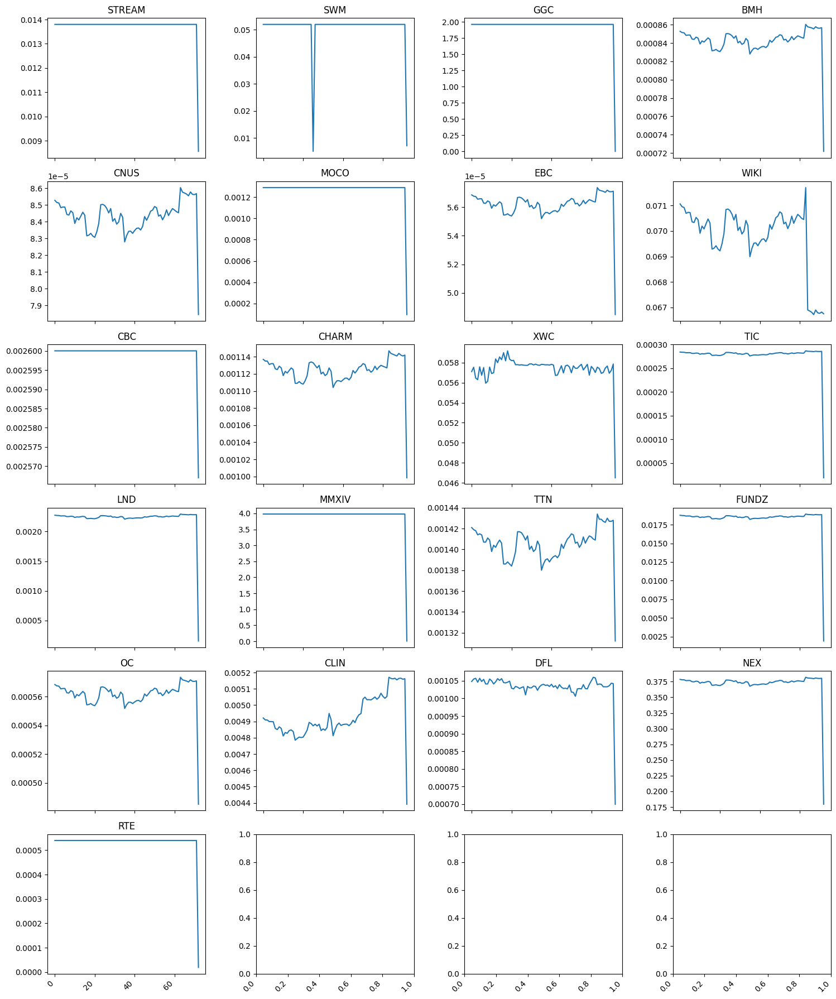

                          Cluster number: 2


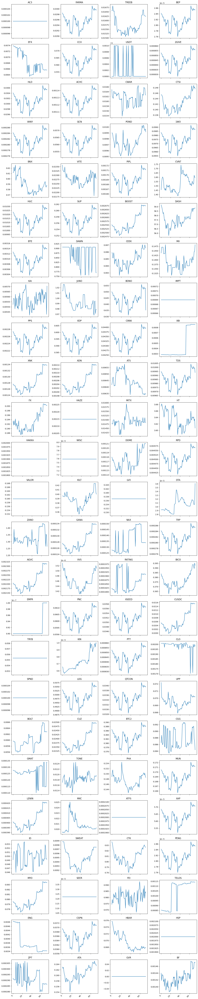

                          Cluster number: 3


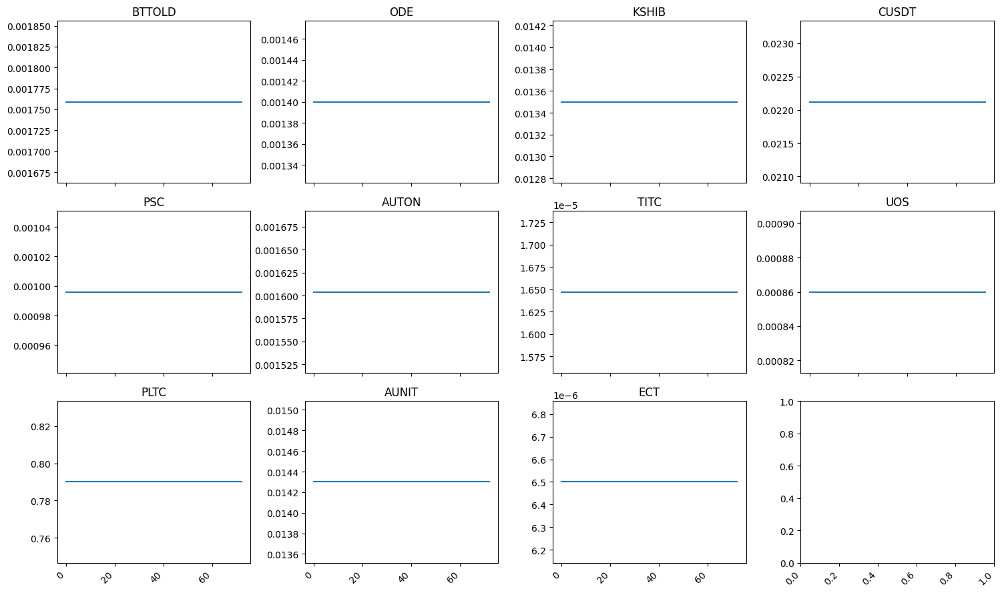

In [41]:
ticker_df_hour = clusters(ticker_df_hour, tickers_scaled_hour, num_of_clusters, "dtw")

#### Какие выводы можно сделать:
    Cluster number: 0 - в основном характеризуется резким скачкообразным ростом в конце периода
    Cluster number: 1 - в основном характеризуется резким скачкообразным падением в конце периода
    Cluster number: 2 - в основном характеризуется поведением типа "падение, рост, падение, рост" (BTC2)
    Cluster number: 3 - постоянные значения

#### За последний час с минутной частотой

In [42]:
ticker_data_minute = []

for ticker in tqdm(coin_list):
    try:
        ticker_obj = cryptocompare.get_historical_price_minute(
            ticker, currency="USD", limit=60
        )
        close_price = list(pd.DataFrame(ticker_obj).close)
        ticker_data_minute.append(close_price)
    except AttributeError:
        continue

ticker_df_minute = pd.DataFrame(ticker_data_minute)

  0%|          | 0/154 [00:00<?, ?it/s]

In [43]:
ticker_df_minute.shape

(154, 61)

In [44]:
scaler = StandardScaler()
tickers_scaled_minute = scaler.fit_transform(ticker_df_minute.T).T

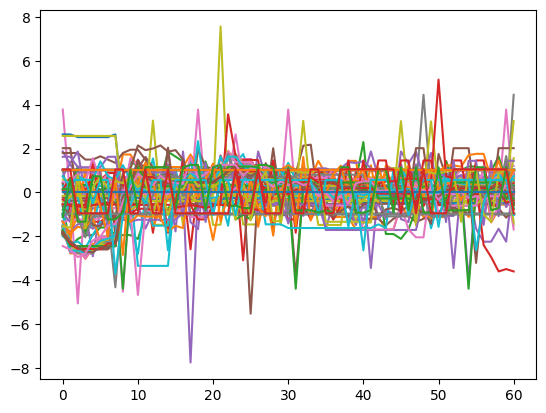

In [45]:
plt.plot(tickers_scaled_minute.T);

  0%|          | 0/9 [00:00<?, ?it/s]

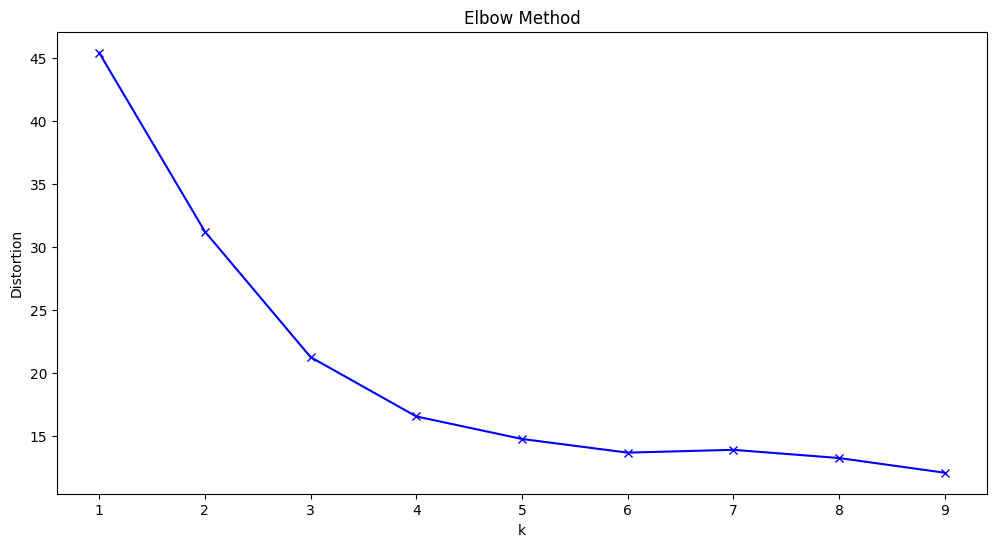

In [46]:
choosing_k(tickers_scaled_minute)

In [47]:
num_of_clusters = 3

### Basic KMeans

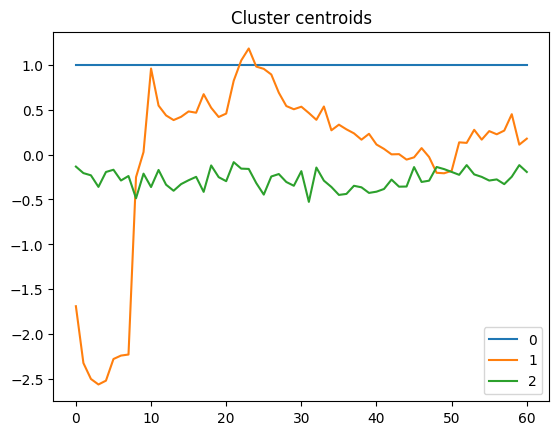

                          Cluster number: 0


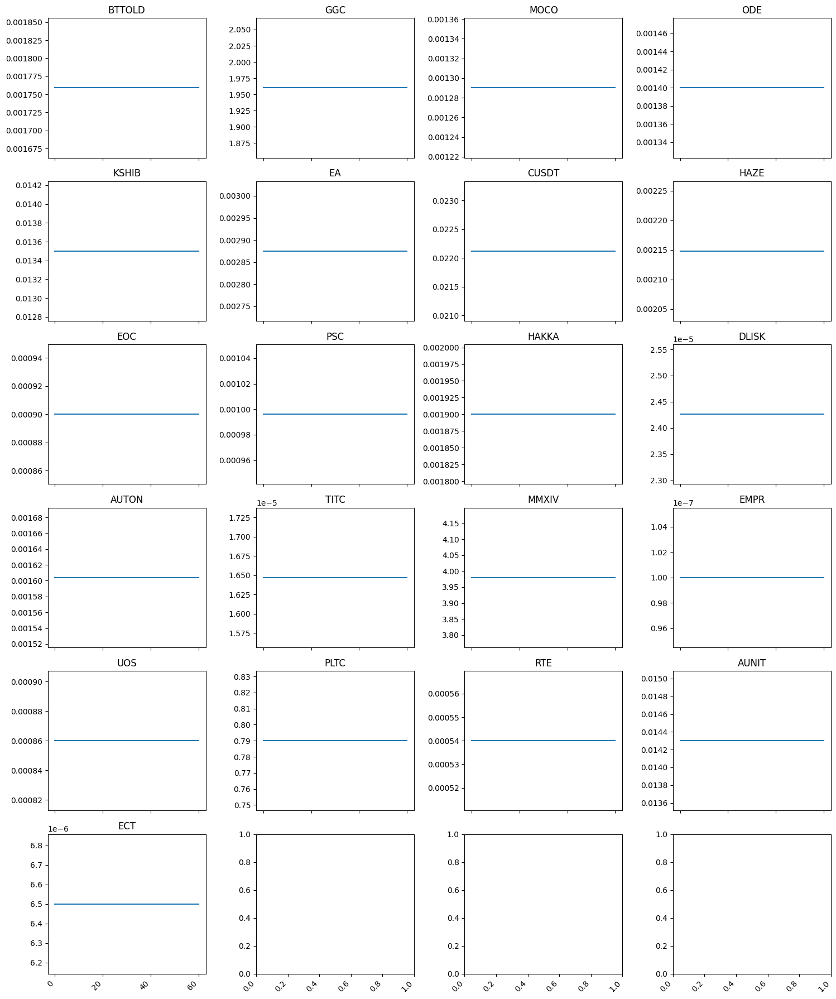

                          Cluster number: 1


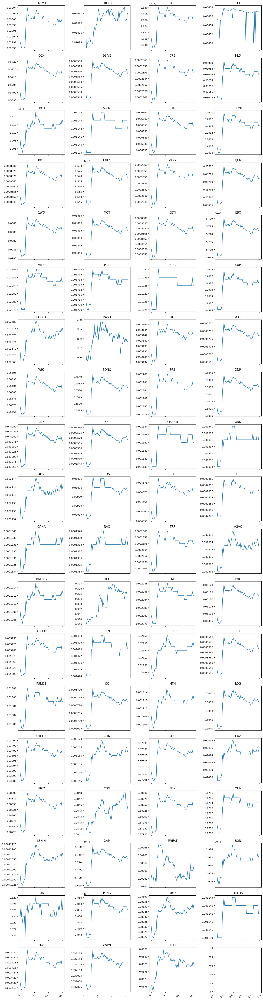

                          Cluster number: 2


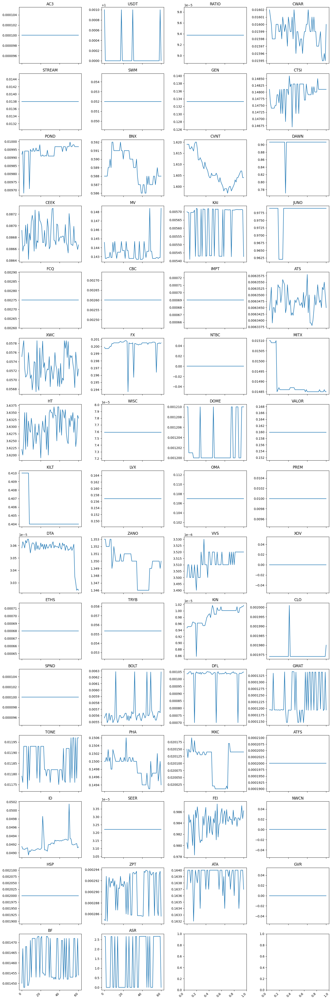

In [48]:
ticker_df_minute = clusters(
    ticker_df_minute, tickers_scaled_minute, num_of_clusters, "euclidean"
)

#### Какие выводы можно сделать:
    Cluster number: 0 - постоянные значения
    Cluster number: 1 - в основном характеризуется резким падением в начале периода и трендом на убывание  (BTC2)
    Cluster number: 2 - В основном пилообразное поведение

### DTW

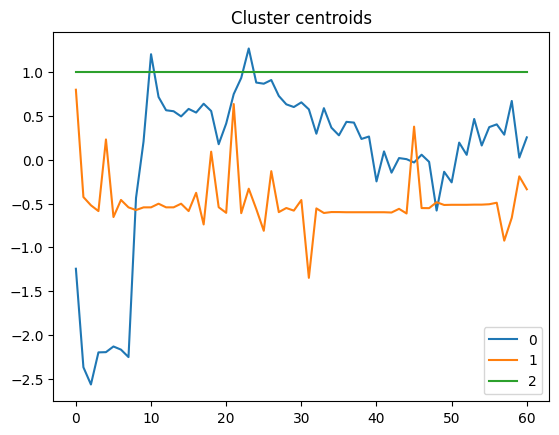

                          Cluster number: 0


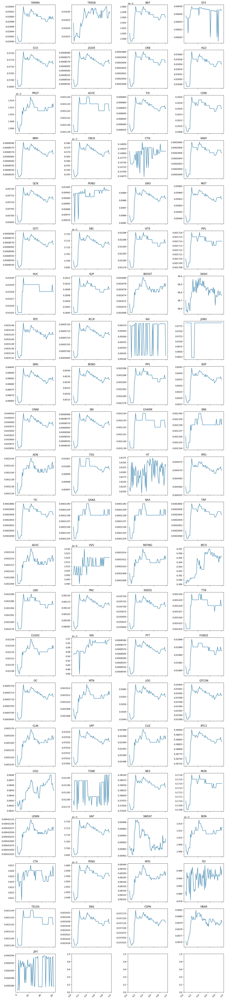

                          Cluster number: 1


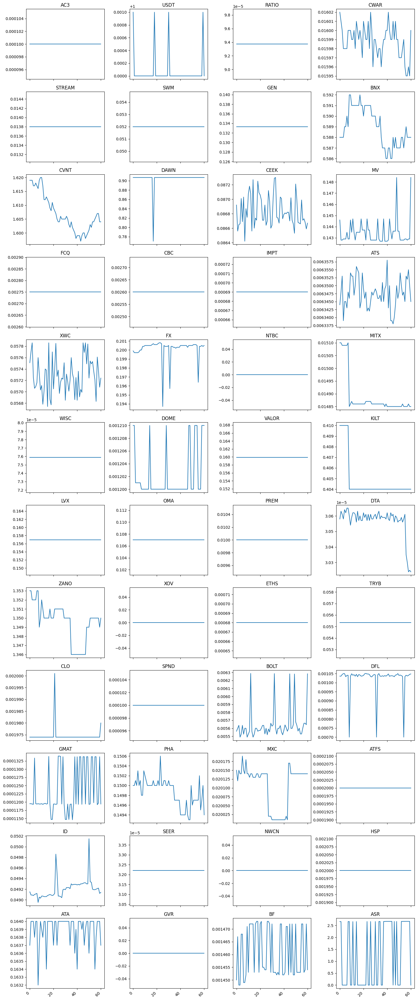

                          Cluster number: 2


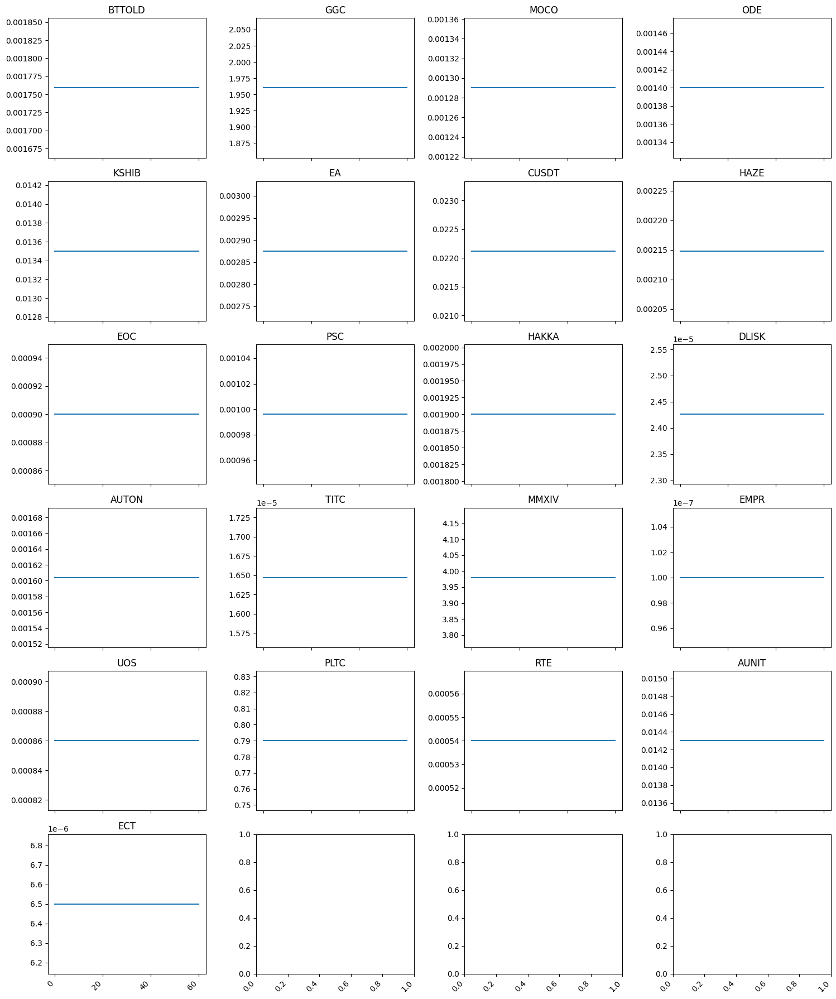

In [49]:
ticker_df_minute = clusters(
    ticker_df_minute, tickers_scaled_minute, num_of_clusters, "dtw"
)

#### Какие выводы можно сделать:
    Cluster number: 0 - в основном характеризуется резким падением в начале периода и трендом на убывание  (BTC2)
    Cluster number: 1 - постоянные значения или пилообразное поведение
    Cluster number: 2 - постоянные значения